In [2]:
import os
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter("ignore")
import requests
import matplotlib
import graphviz
import missingno as msno
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression as LGR
from sklearn.neural_network import MLPClassifier as MLP
from sklearn import tree
from sklearn.preprocessing import PowerTransformer
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import mean_squared_error
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
from math import sqrt
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import zscore
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from collections import OrderedDict
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from xgboost import XGBClassifier
from xgboost.sklearn import XGBRegressor
import pandas_profiling
import missingno

In [3]:
df = pd.read_excel(r"Data_Train.xlsx")
df.tail(5)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648
10682,Air India,9/05/2019,Delhi,Cochin,DEL → GOI → BOM → COK,10:55,19:15,8h 20m,2 stops,No info,11753


In [4]:
df.info()

#below result shows that there is no null values in the data and the Data Type.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


In [5]:
df.drop(['Additional_Info'], axis = 1)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,13302
...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,12648


In [6]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Airline,10683,12,Jet Airways,3849,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Date_of_Journey,10683,44,18/05/2019,504,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Source,10683,5,Delhi,4537,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Destination,10683,6,Cochin,4537,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Route,10682,128,DEL → BOM → COK,2376,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dep_Time,10683,222,18:55,233,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Arrival_Time,10683,1343,19:00,423,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Duration,10683,368,2h 50m,550,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Total_Stops,10682,5,1 stop,5625,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Additional_Info,10683,10,No info,8345,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df.nunique()

Airline              12
Date_of_Journey      44
Source                5
Destination           6
Route               128
Dep_Time            222
Arrival_Time       1343
Duration            368
Total_Stops           5
Additional_Info      10
Price              1870
dtype: int64

In [8]:
value = ["Airline", "Date_of_Journey", "Source", "Destination", "Route", "Dep_Time", "Arrival_Time", "Duration", "Total_Stops"]
for col in value:
    print(col)
    print(df[col].value_counts())
    print("-"*100)

Airline
Jet Airways                          3849
IndiGo                               2053
Air India                            1752
Multiple carriers                    1196
SpiceJet                              818
Vistara                               479
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: Airline, dtype: int64
----------------------------------------------------------------------------------------------------
Date_of_Journey
18/05/2019    504
6/06/2019     503
21/05/2019    497
9/06/2019     495
12/06/2019    493
9/05/2019     484
21/03/2019    423
15/05/2019    405
27/05/2019    382
27/06/2019    355
24/06/2019    351
1/06/2019     342
3/06/2019     333
15/06/2019    328
24/03/2019    323
6/03/2019     308
27/03/2019    299
24/05/2019    286
6/05/2019     282
1

In [9]:
df.isna().sum() # checking for missing values

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

In [10]:
# filling categorical data columns with the mode value of that column
df['Route']=df['Route'].fillna(df['Route'].mode()[0])
df['Total_Stops'] = df['Total_Stops'].fillna(df['Total_Stops'].mode()[0])

In [11]:
df.isna().sum() # checking for missing values

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
Price              0
dtype: int64

# Analysing & Visualization the data

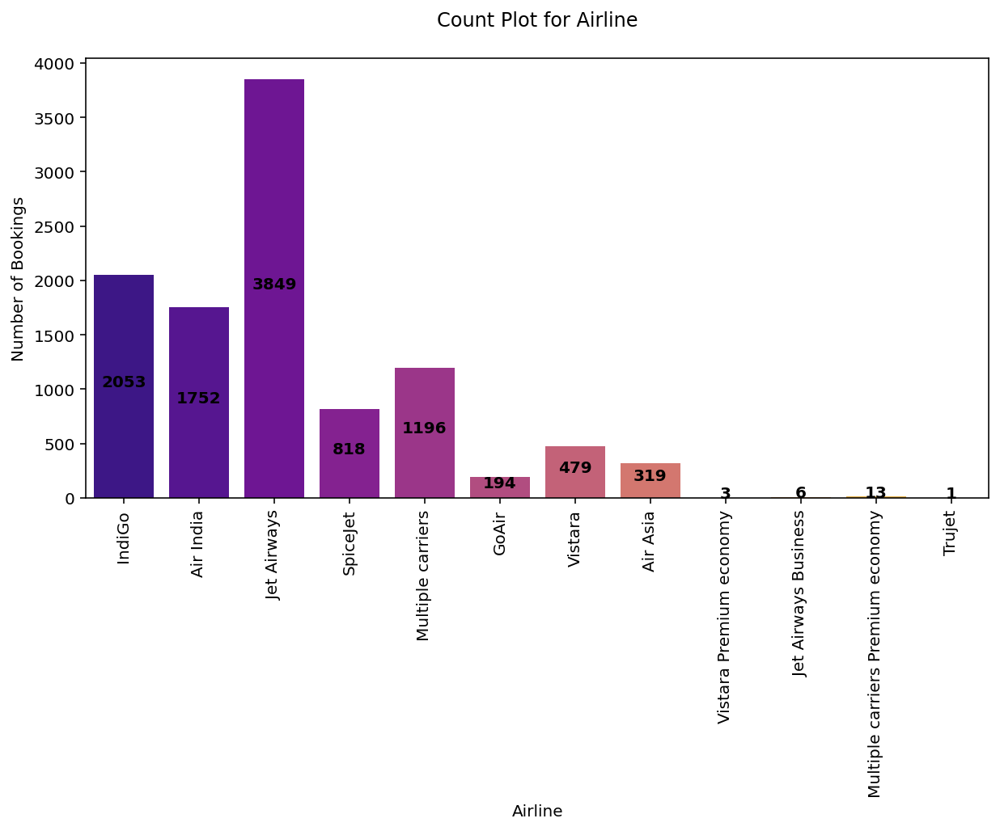

In [12]:
try:
    plt.figure(figsize=(10,5))
    col_name = 'Airline'
    values = df[col_name].value_counts()
    index = 0
    ax = sns.countplot(df[col_name], palette="plasma")
    for i in ax.get_xticklabels():
        ax.text(index, values[i.get_text()]/2, values[i.get_text()], 
                horizontalalignment="center", fontweight='bold', color='k')
        index += 1
    plt.title(f"Count Plot for {col_name}\n")
    plt.ylabel(f"Number of Bookings")
    plt.xticks(rotation=90)
    plt.show()
    
except Exception as e:
    pass


#below shows the number of bookings with Airlines

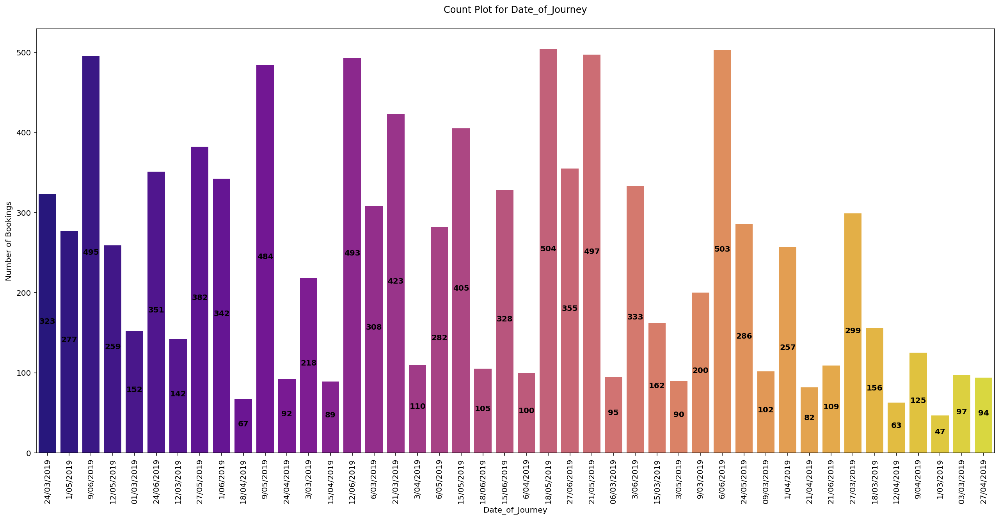

In [13]:
try:
    plt.figure(figsize=(22,10))
    col_name = 'Date_of_Journey'
    values = df[col_name].value_counts()
    index = 0
    ax = sns.countplot(df[col_name], palette="plasma")
    for i in ax.get_xticklabels():
        ax.text(index, values[i.get_text()]/2, values[i.get_text()], 
                horizontalalignment="center", fontweight='bold', color='k')
        index += 1
    plt.title(f"Count Plot for {col_name}\n")
    plt.ylabel(f"Number of Bookings")
    plt.xticks(rotation=90)
    plt.show()
    
except Exception as e:
    pass


#below shows the number of bookings as per the date of Journey

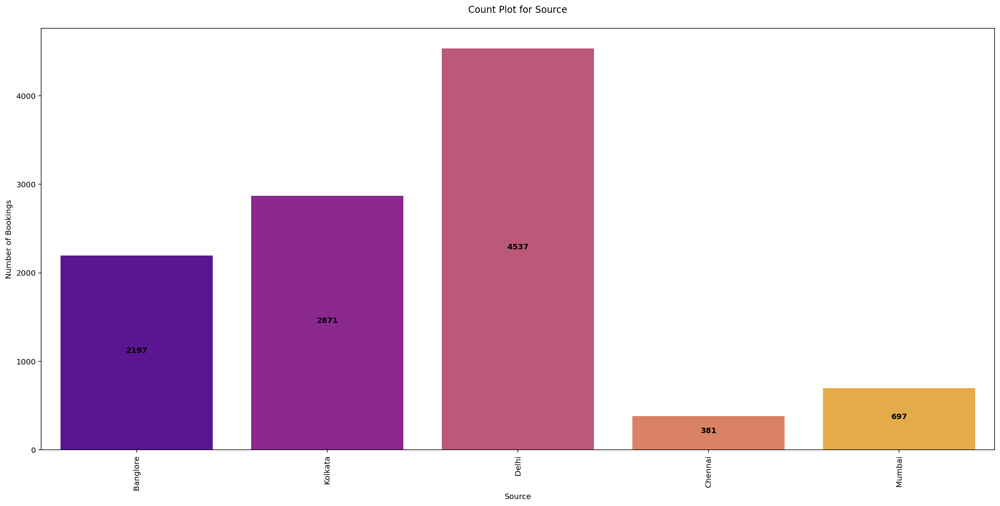

In [14]:
try:
    plt.figure(figsize=(22,10))
    col_name = 'Source'
    values = df[col_name].value_counts()
    index = 0
    ax = sns.countplot(df[col_name], palette="plasma")
    for i in ax.get_xticklabels():
        ax.text(index, values[i.get_text()]/2, values[i.get_text()], 
                horizontalalignment="center", fontweight='bold', color='k')
        index += 1
    plt.title(f"Count Plot for {col_name}\n")
    plt.ylabel(f"Number of Bookings")
    plt.xticks(rotation=90)
    plt.show()
    
except Exception as e:
    pass


#below shows the number of bookings as per the date of Departure loctaion

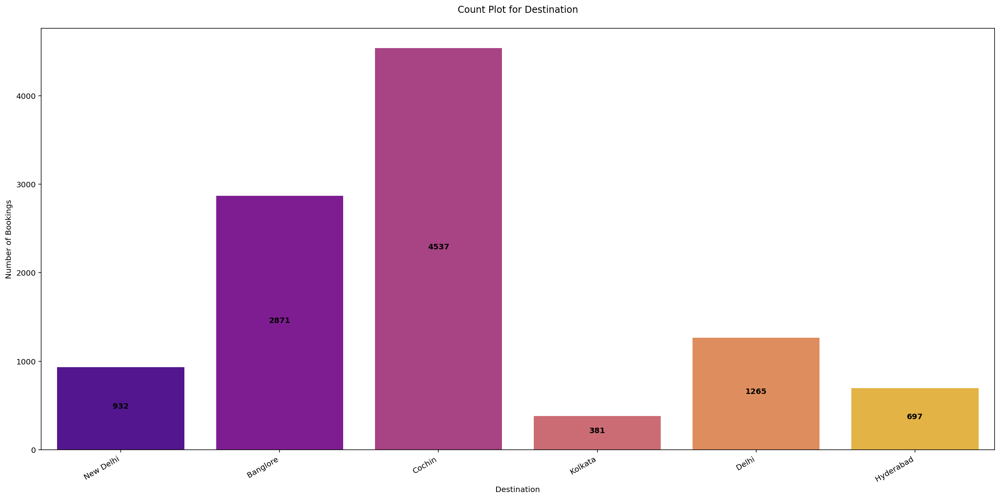

In [15]:
try:
    plt.figure(figsize=(22,10))
    col_name = 'Destination'
    values = df[col_name].value_counts()
    index = 0
    ax = sns.countplot(df[col_name], palette="plasma")
    for i in ax.get_xticklabels():
        ax.text(index, values[i.get_text()]/2, values[i.get_text()], 
                horizontalalignment="center", fontweight='bold', color='k')
        index += 1
    plt.title(f"Count Plot for {col_name}\n")
    plt.ylabel(f"Number of Bookings")
    plt.xticks(rotation = 30, ha='right')
    plt.show()
    
except Exception as e:
    pass


#below shows the number of bookings as per the date of Destination loctaion

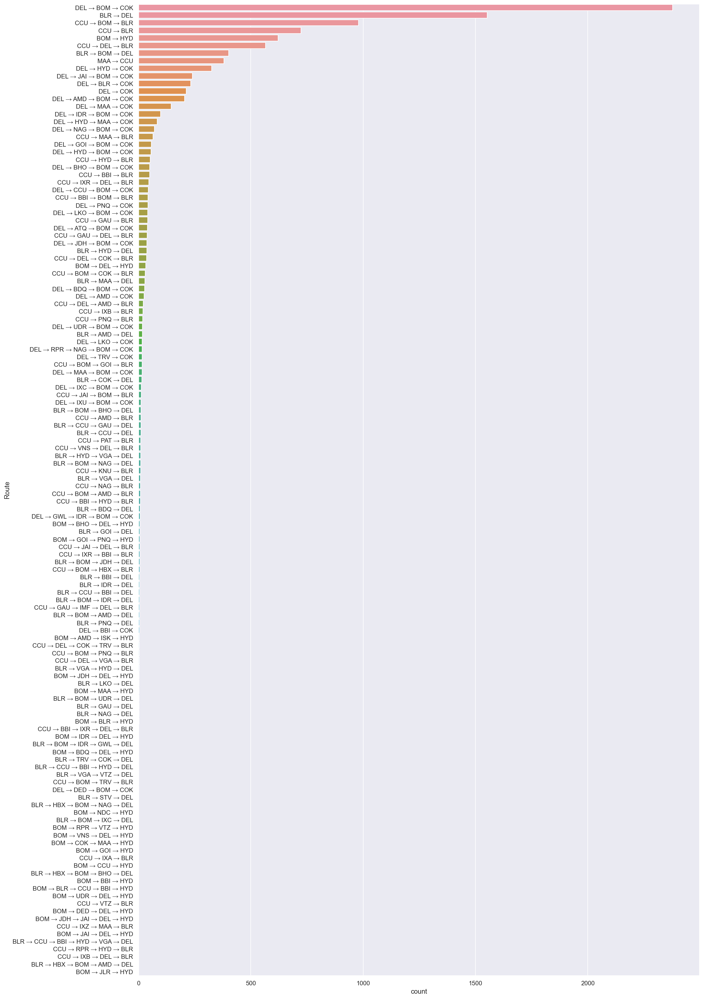

In [16]:
plt.figure(figsize=(18,32))
sns.set(style='darkgrid')
sns.countplot(y = 'Route',
              data = df,
              order = df['Route'].value_counts().index)
plt.show()

#below chart shows more travelling happened on Del->BOM->COK and follows BLR->DEL.

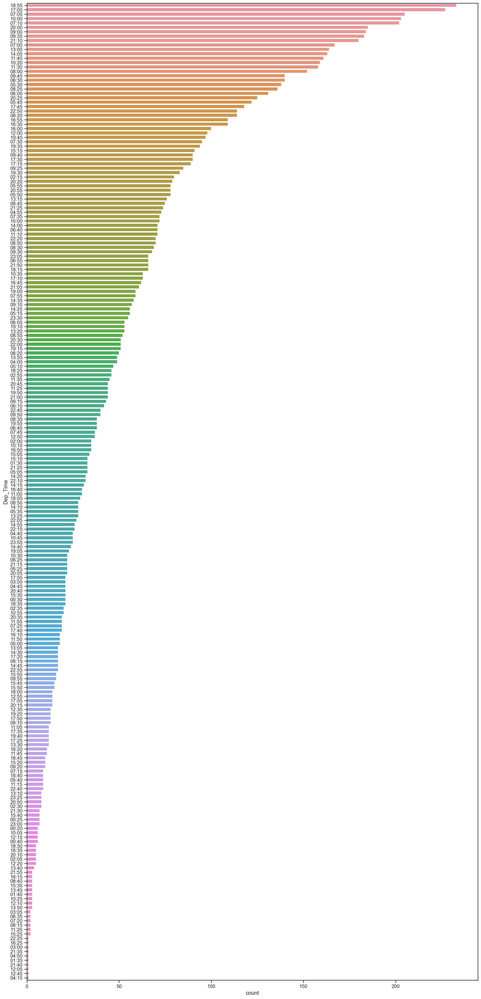

In [17]:
plt.figure(figsize=(18,40))
sns.set(style='ticks')
sns.countplot(y = 'Dep_Time',
              data = df,
              order = df['Dep_Time'].value_counts().index)
plt.show()


#below chart shows more travelling happened on 18:55, 17:00, 07:05 so on...

In [18]:
plt.figure(figsize=(20,200))
sns.set(style='ticks')
sns.countplot(y = 'Arrival_Time',
              data = df,
              order = df['Arrival_Time'].value_counts().index)
plt.show()


#below chart shows more Arival Time happened on 19:00, 21:00, 19:15, 16:10 so on...

In [19]:
plt.figure(figsize=(20,200))
sns.set(style='ticks')
sns.countplot(y = 'Duration',
              data = df,
              order = df['Duration'].value_counts().index)
plt.show()


#below chart shows more Duration of Travelling period is 2h 50m, 1h 30m, 2h 55m and so on.

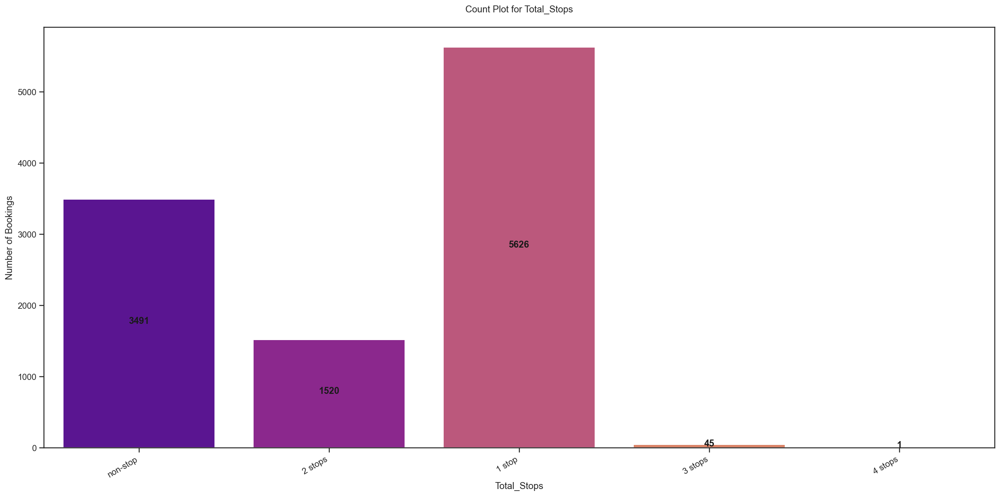

In [20]:
try:
    plt.figure(figsize=(22,10))
    col_name = 'Total_Stops'
    values = df[col_name].value_counts()
    index = 0
    ax = sns.countplot(df[col_name], palette="plasma")
    for i in ax.get_xticklabels():
        ax.text(index, values[i.get_text()]/2, values[i.get_text()], 
                horizontalalignment="center", fontweight='bold', color='k')
        index += 1
    plt.title(f"Count Plot for {col_name}\n")
    plt.ylabel(f"Number of Bookings")
    plt.xticks(rotation = 30, ha='right')
    plt.show()
    
except Exception as e:
    pass


#below chart shows the number of stops used on travelling. More number of booking happened with 1 stop and followed by non-stop routes.

In [21]:
plt.figure(figsize=(20,300))
sns.set(style='darkgrid')
sns.countplot(y = 'Price',
              data = df,
              order = df['Price'].value_counts().index)
plt.show()


#below chart shows more booking happened on Rs.10262, Rs.10844, Rs.7229 goes on....

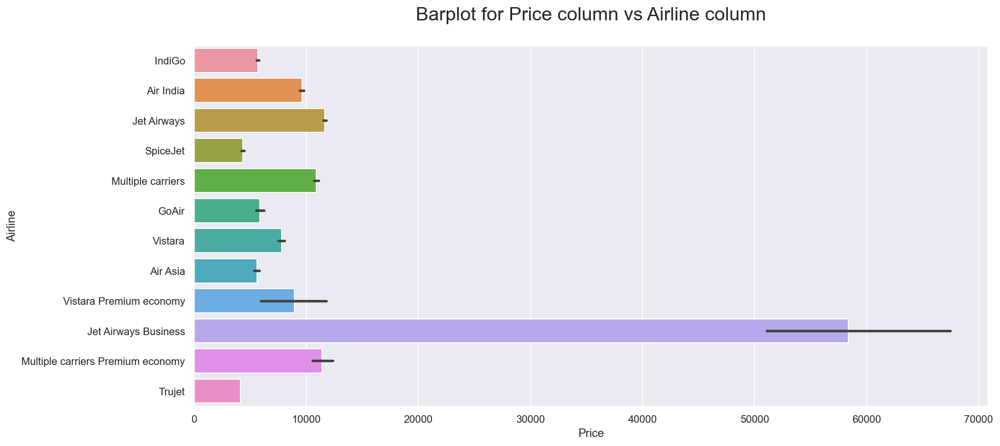

In [22]:
y = 'Airline'

x = 'Price'
plt.figure(figsize=[15,7])
sns.barplot(x,y,data=df,orient='h')
plt.title(f"Barplot for {x} column vs {y} column\n", fontsize = 20)
plt.show()

#below chart shows the highest price in Jet Airways Business.

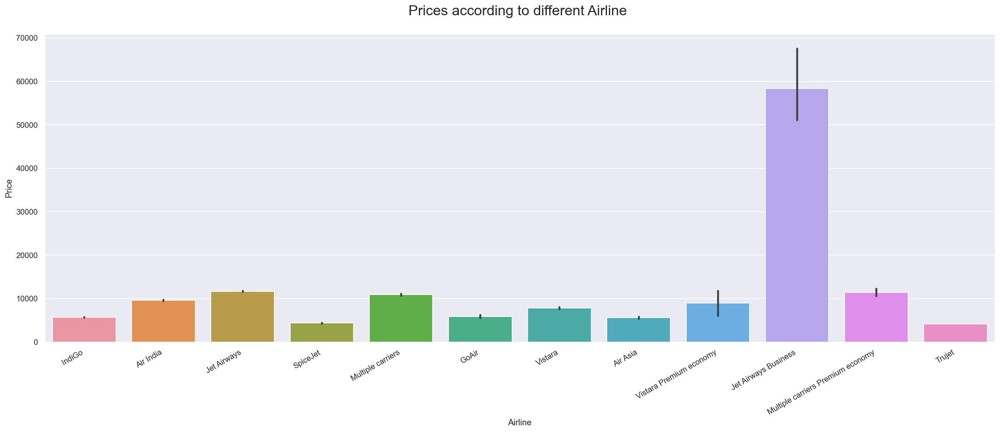

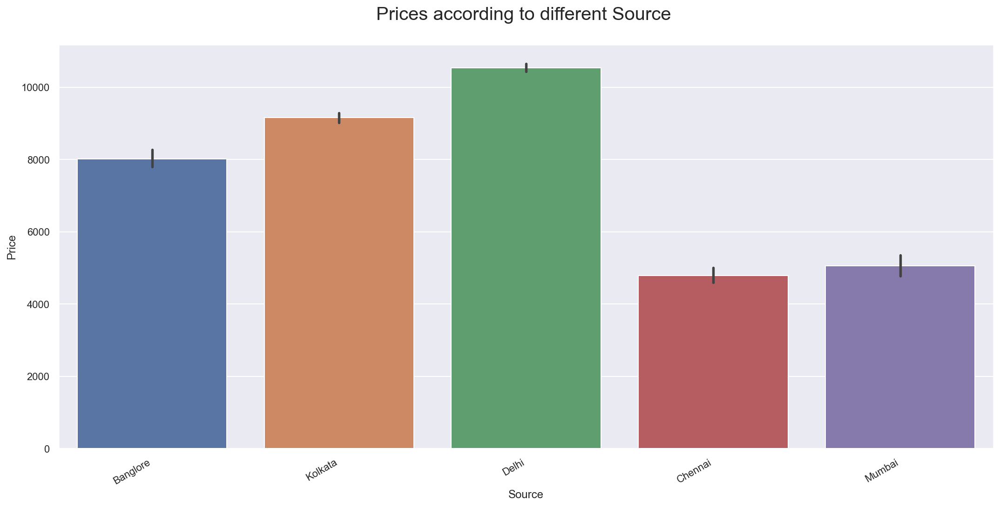

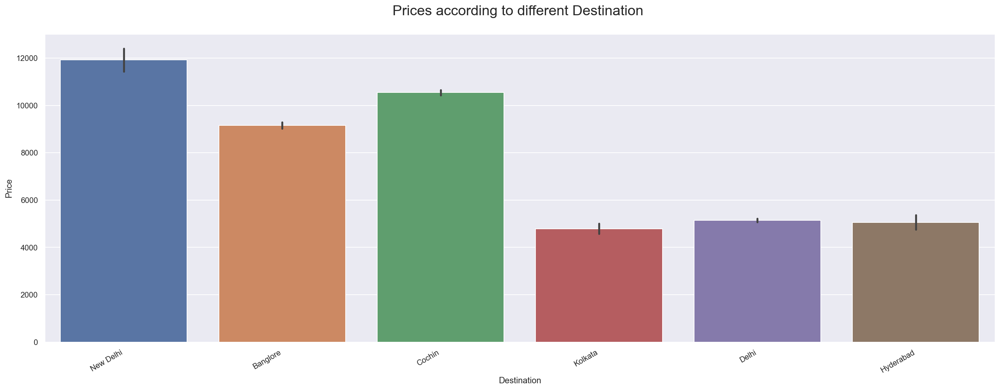

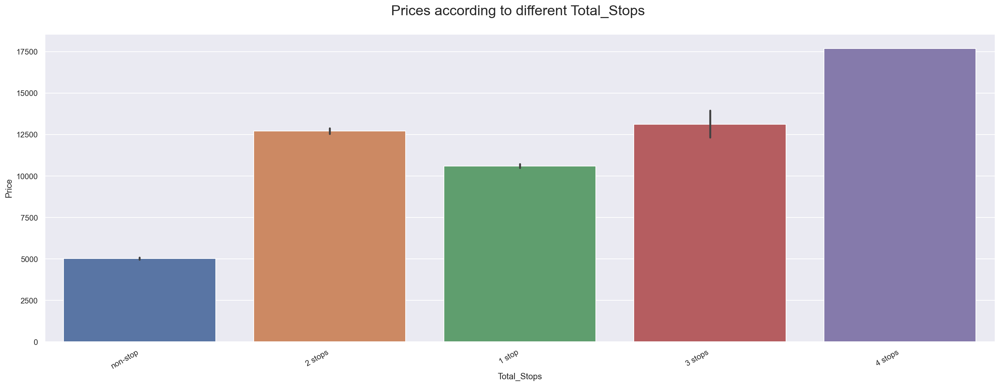

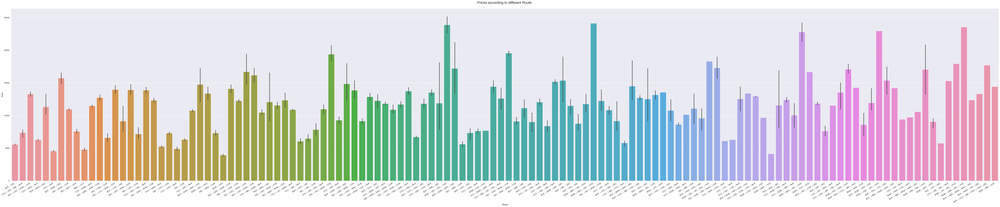

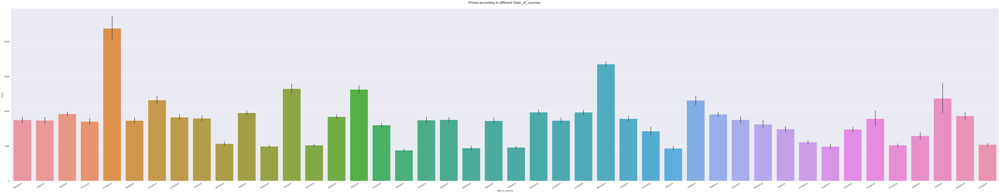

In [23]:
y = "Price"

x = "Airline"
plt.figure(figsize = (24,8))
plt.xticks(rotation = 30, ha='right')
sns.barplot(data = df, y = y, x = x)
plt.title(f"Prices according to different {x} \n", fontsize = 20)
plt.show()

x = "Source"
plt.figure(figsize = (18,8))
plt.xticks(rotation = 30, ha='right')
sns.barplot(data = df, y = y, x = x)
plt.title(f"Prices according to different {x} \n", fontsize = 20)
plt.show()

x = "Destination"
plt.figure(figsize = (24,8))
plt.xticks(rotation = 30, ha='right')
sns.barplot(data = df, y = y, x = x)
plt.title(f"Prices according to different {x} \n", fontsize = 20)
plt.show()

x = "Total_Stops"
plt.figure(figsize = (24,8))
plt.xticks(rotation = 30, ha='right')
sns.barplot(data = df, y = y, x = x)
plt.title(f"Prices according to different {x} \n", fontsize = 20)
plt.show()

x = "Route"
plt.figure(figsize = (100,18))
plt.xticks(rotation = 30, ha='right')
sns.barplot(data = df, y = y, x = x)
plt.title(f"Prices according to different {x} \n", fontsize = 20)
plt.show()

x = "Date_of_Journey"
plt.figure(figsize = (100,18))
plt.xticks(rotation = 30, ha='right')
sns.barplot(data = df, y = y, x = x)
plt.title(f"Prices according to different {x} \n", fontsize = 20)
plt.show()

x = "Duration"
plt.figure(figsize = (200,24))
plt.xticks(rotation = 30, ha='right')
sns.barplot(data = df, y = y, x = x)
plt.title(f"Prices according to different {x} \n", fontsize = 20)
plt.show()

x = "Dep_Time"
plt.figure(figsize = (200,24))
plt.xticks(rotation = 30, ha='right')
sns.barplot(data = df, y = y, x = x)
plt.title(f"Prices according to different {x} \n", fontsize = 20)
plt.show()

x = "Arrival_Time"
plt.figure(figsize = (200,24))
plt.xticks(rotation = 30, ha='right')
sns.barplot(data = df, y = y, x = x)
plt.title(f"Prices according to different {x} \n", fontsize = 20)
plt.show()

#below shows the comparrison with the Price for all the columns.

In [24]:
#Preferred Top 3 Airline = 1.Jet Airways, 2. IndiGo, 3. Air India
#Preferred Top 3 Departure Location = 1.Delhi, 2. Kolkata, 3. Bangalore
#Preferred Top 3 Destination = 1. Cochin, 2. Bangalore, 3. Delhi
#Preferred Top 3 Routes = 1. Del>BOM>COK, 2. BLR>DEL, 3. CCU>BOM>BLR
#Preferred Top 3 Departure Time = 1.18:55, 2.17:00, 3.07.05
#Preferred Top 3 Arrival Time = 1.19:00, 2.21:00, 3.19.15
#Preferred Top 3 Travelling Duration = 1.2h 50m, 2. 1h 30m, 3. 2h 55m
#Preferred Top 3 Stops = 1. 1 Stop, 2. non-stop, 3. 2 Stops
#Preferred Top 3 Price = 1. Rs. 10262, 2. Rs.10844, 3. Rs.7229
#Jet Airways Business tops the most expensive pricing in ticket.


#Price vs Airline = Jet Airways Business
#Price vs Date_of_Journey = 01/03/2019
#Price vs Source = Delhi
#Price vs Destination = New Delhi
#Price vs Route = BOM -> JDH -> DEL -> HYD
#Price vs Dep_Time = 18:40
#Price vs Duration = 13h 35m
#Price vs Total_Stops = 4 Stops

In [25]:
#Encoding the categorical object datatype columns

In [26]:
# Ordinal Encoding

oe = OrdinalEncoder()

def ordinal_encode(df, column):
    df[column] = oe.fit_transform(df[column])
    return df

oe_col = df.columns
df=ordinal_encode(df, oe_col)
df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,3.0,24.0,0.0,5.0,18.0,211.0,233.0,240.0,4.0,8.0,65.0
1,1.0,6.0,3.0,0.0,84.0,31.0,906.0,336.0,1.0,8.0,669.0
2,4.0,43.0,2.0,1.0,118.0,70.0,413.0,106.0,1.0,8.0,1537.0
3,3.0,10.0,3.0,0.0,91.0,164.0,1324.0,311.0,0.0,8.0,389.0
4,3.0,0.0,0.0,5.0,29.0,149.0,1237.0,303.0,0.0,8.0,1457.0


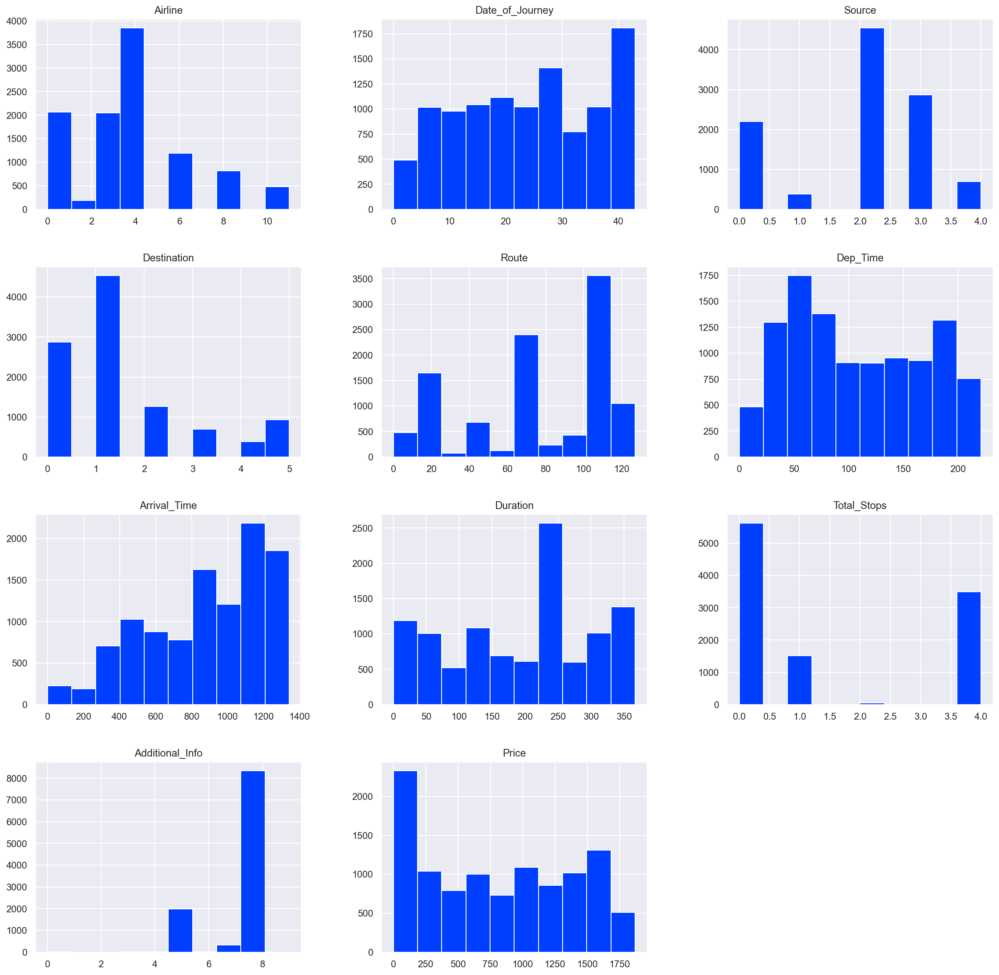

In [27]:
plt.style.use('seaborn-bright')

df.hist(figsize=(20,20))
plt.show()

# Correlation using a Heatmap

#Positive correlation - A correlation of +1 indicates a perfect positive correlation, meaning that both variables move in the same direction together.


#Negative correlation - A correlation of –1 indicates a perfect negative correlation, meaning that as one variable goes up, the other goes down.

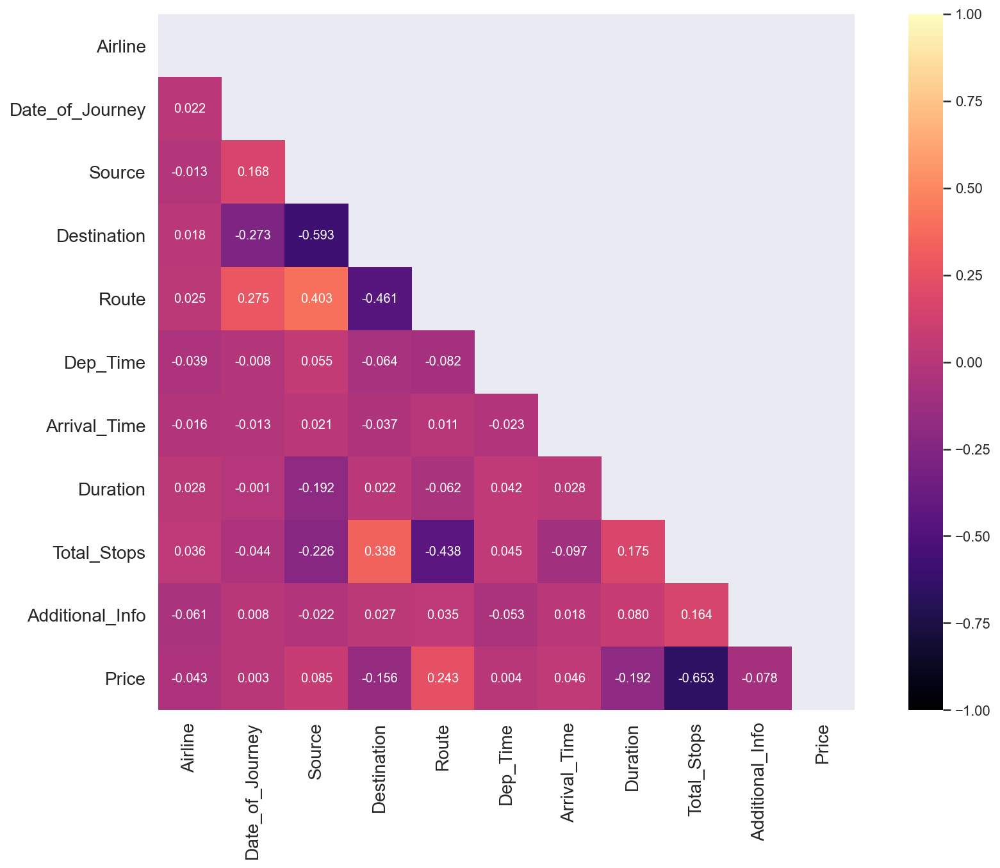

In [28]:
upper_triangle = np.triu(df.corr())
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':10}, cmap="magma", mask=upper_triangle)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

# Correlation Bar Plot comparing target column with the feature columns

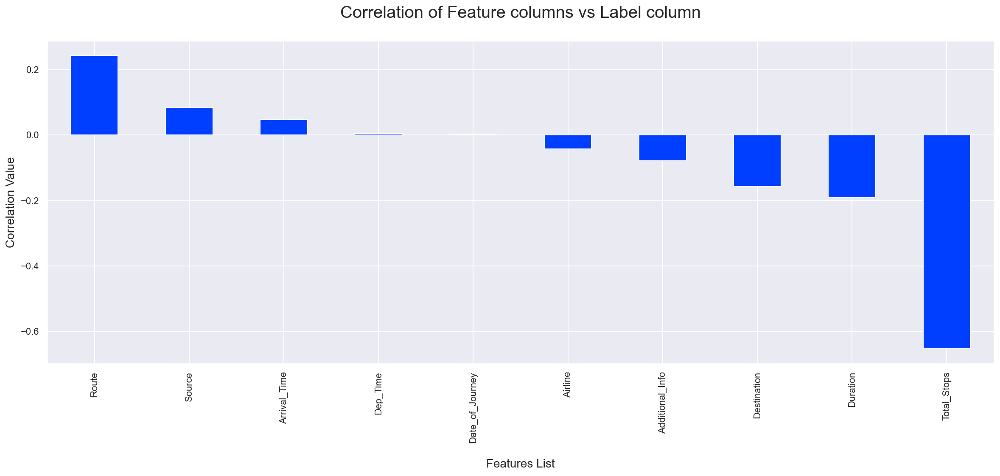

In [29]:
df_corr = df.corr()
plt.figure(figsize=(20,7))
df_corr['Price'].sort_values(ascending=False).drop('Price').plot.bar()
plt.title("Correlation of Feature columns vs Label column\n", fontsize=20)
plt.xlabel("\nFeatures List", fontsize=14)
plt.ylabel("Correlation Value", fontsize=14)
plt.show()

In [30]:
#above correlation map shows Route, Source, Arrival Time and Dep Time on Possitive Correlation.
#above correlation map shows Airline, Additional Info , Destination, Duration and Total Stops in Negative Correlation

In [31]:
#Checking for Outliers

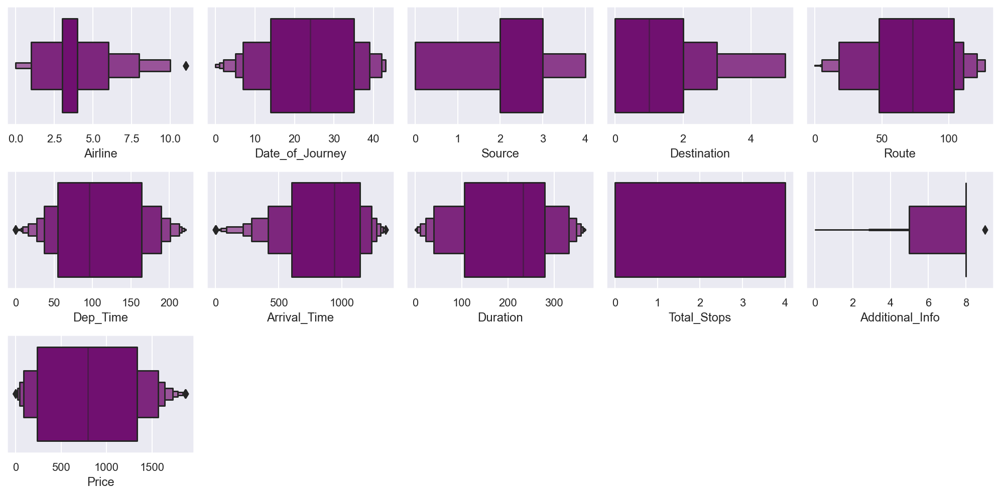

In [32]:
plt.figure(figsize=(14,7))
outl_df = df.columns.values
for i in range(0, len(outl_df)):
    plt.subplot(3, 5, i+1)
    ax = sns.boxenplot(df[outl_df[i]], color='purple')
    plt.tight_layout()

In [33]:
df.skew()

Airline            0.731095
Date_of_Journey   -0.070888
Source            -0.424054
Destination        1.244169
Route             -0.502066
Dep_Time           0.195055
Arrival_Time      -0.606530
Duration          -0.213427
Total_Stops        0.631681
Additional_Info   -1.779838
Price              0.114408
dtype: float64

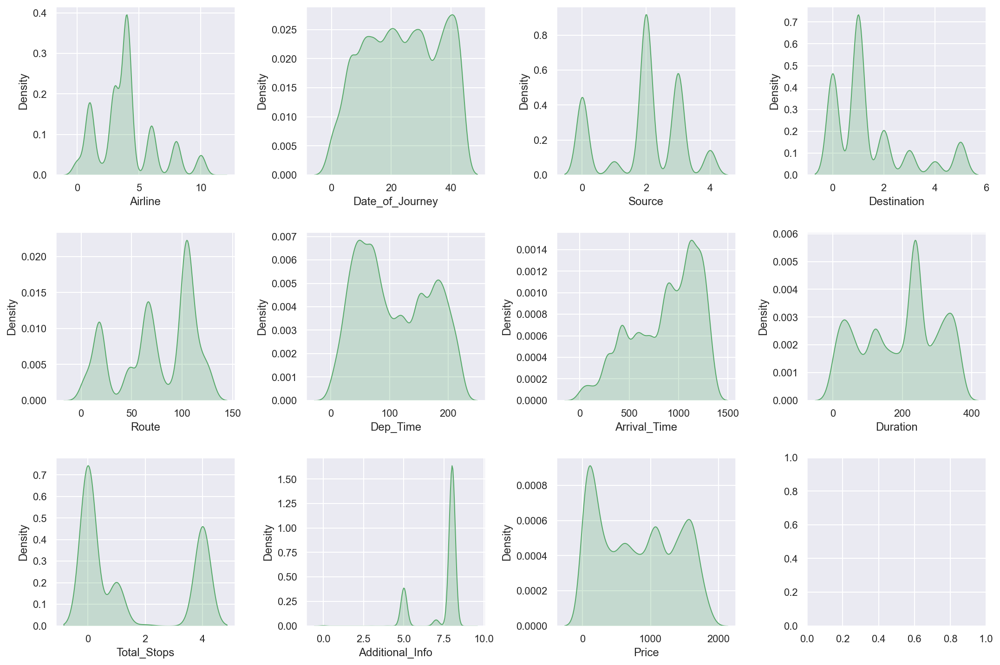

In [34]:
fig, ax = plt.subplots(ncols=4, nrows=3, figsize=(15,10))
index = 0
ax = ax.flatten()
for col, value in df.items():
    sns.distplot(value, ax=ax[index], hist=False, color="g", kde_kws={"shade": True})
    index += 1
plt.tight_layout(pad=0.8, w_pad=0.8, h_pad=2.0)
plt.show()

# Splitting the dataset into 2 variables namely 'X' and 'Y' for feature and label

In [35]:
X = df.drop('Price', axis=1)
Y = df['Price']

# Finding the best random state for building Regression Models

In [36]:
maxAccu=0
maxRS=0

for i in range(1, 1000):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=i)
    lr=LinearRegression()
    lr.fit(X_train, Y_train)
    pred = lr.predict(X_test)
    r2 = r2_score(Y_test, pred)
    
    if r2>maxAccu:
        maxAccu=r2
        maxRS=i

print("Best R2 score is", maxAccu*100,"on Random State", maxRS)

Best R2 score is 47.29760131808677 on Random State 828


# Feature importance bar graph

,Importance
Features,
Total_Stops,0.558
Airline,0.118
Date_of_Journey,0.108
Additional_Info,0.061
Route,0.043
Arrival_Time,0.036
Duration,0.036
Dep_Time,0.031
Destination,0.006


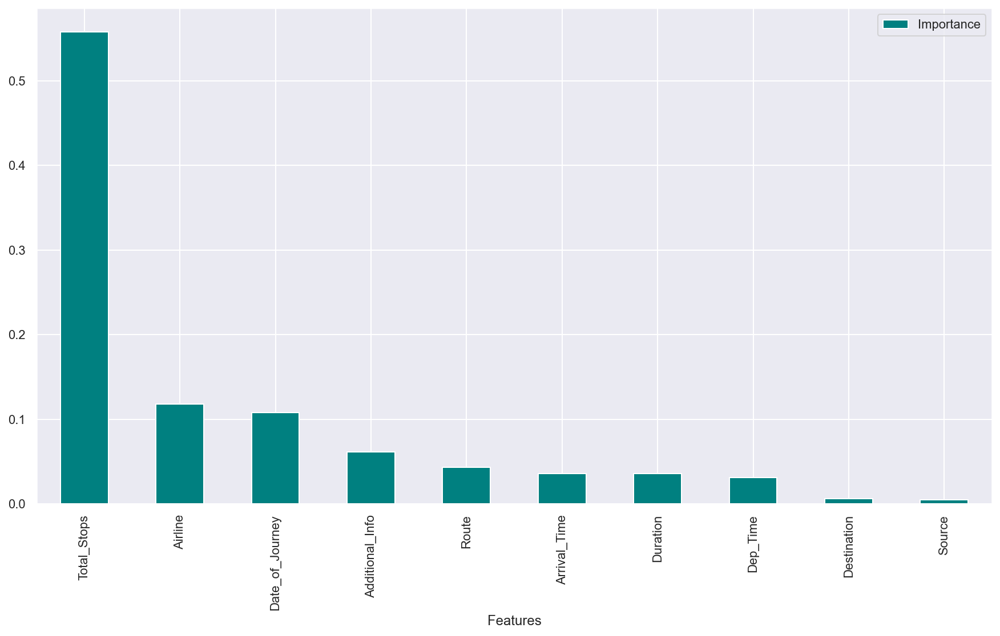

In [37]:
rf=RandomForestRegressor()
rf.fit(X_train, Y_train)
importances = pd.DataFrame({'Features':X.columns, 'Importance':np.round(rf.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
plt.rcParams["figure.figsize"] = (15,8)
importances.plot.bar(color='teal')
importances

# Machine Learning Model for Regression with Evaluation Metrics

In [38]:
# Regression Model Function

def reg(model, X, Y):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=638)
    
    # Training the model
    model.fit(X_train, Y_train)
    
    # Predicting Y_test
    pred = model.predict(X_test)
    
    # RMSE - a lower RMSE score is better than a higher one
    rmse = mean_squared_error(Y_test, pred, squared=False)
    print("RMSE Score is:", rmse)
    
    # R2 score
    r2 = r2_score(Y_test, pred, multioutput='variance_weighted')*100
    print("R2 Score is:", r2)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, X, Y, cv=5).mean())*100
    print("Cross Validation Score:", cv_score)
    
    # Result of r2 score minus cv score
    result = r2 - cv_score
    print("R2 Score - Cross Validation Score is", result)

In [39]:
# Linear Regression Model

model=LinearRegression()
reg(model, X, Y)

RMSE Score is: 422.5468124013608
R2 Score is: 44.437399684741116
Cross Validation Score: 44.20646384390901
R2 Score - Cross Validation Score is 0.23093584083210317


In [40]:
# Ridge Regularization

model=Ridge(alpha=1e-2, normalize=True)
reg(model, X, Y)

RMSE Score is: 422.5634933107523
R2 Score is: 44.43301270101022
Cross Validation Score: 44.20143488277173
R2 Score - Cross Validation Score is 0.23157781823849177


In [41]:
# Lasso Regularization

model=Lasso(alpha=1e-2, normalize=True, max_iter=1e5)
reg(model, X, Y)

RMSE Score is: 422.58923059194257
R2 Score is: 44.426243603571066
Cross Validation Score: 44.204136671280736
R2 Score - Cross Validation Score is 0.2221069322903304


In [42]:
# Decision Tree Regressor

model=DecisionTreeRegressor(criterion="poisson", random_state=111)
reg(model, X, Y)

RMSE Score is: 356.61646321004156
R2 Score is: 60.42365531678981
Cross Validation Score: 62.61088677071661
R2 Score - Cross Validation Score is -2.187231453926799


In [43]:
# Random Forest Regressor

model=RandomForestRegressor(max_depth=2, max_features="sqrt")
reg(model, X, Y)

RMSE Score is: 380.8556489636932
R2 Score is: 54.86081579447322
Cross Validation Score: 53.97110674309301
R2 Score - Cross Validation Score is 0.8897090513802084


In [44]:
# K Neighbors Regressor

KNeighborsRegressor(n_neighbors=2, algorithm='kd_tree')
reg(model, X, Y)

RMSE Score is: 379.54715972488077
R2 Score is: 55.17044845921281
Cross Validation Score: 53.803793729942726
R2 Score - Cross Validation Score is 1.3666547292700812


In [45]:
# Gradient Boosting Regressor

model=GradientBoostingRegressor(loss='quantile', n_estimators=200, max_depth=5)
reg(model, X, Y)

RMSE Score is: 367.4959526469322
R2 Score is: 57.97206774139286
Cross Validation Score: 61.712809319617094
R2 Score - Cross Validation Score is -3.740741578224231


In [46]:
# Ada Boost Regressor

model=AdaBoostRegressor(n_estimators=300, learning_rate=1.05, random_state=42)
reg(model, X, Y)

RMSE Score is: 340.83675276820935
R2 Score is: 63.848548361386094
Cross Validation Score: 62.76680704612596
R2 Score - Cross Validation Score is 1.0817413152601318


In [47]:
# Extra Trees Regressor

model=ExtraTreesRegressor(n_estimators=200, max_features='sqrt', n_jobs=6)
reg(model, X, Y)

RMSE Score is: 219.66490716640857
R2 Score is: 84.98399980738301
Cross Validation Score: 86.03649184802782
R2 Score - Cross Validation Score is -1.0524920406448075


# Hyper parameter tuning

In [48]:
# Choosing Extra Trees Regressor

fmod_param = {'n_estimators' : [100, 200, 300],
              'criterion' : ['squared_error', 'mse', 'absolute_error', 'mae'],
              'n_jobs' : [-2, -1, 1],
              'random_state' : [42, 251, 340]
             }

In [49]:
GSCV = GridSearchCV(ExtraTreesRegressor(), fmod_param, cv=5)
GSCV.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'mse', 'absolute_error',
                                       'mae'],
                         'n_estimators': [100, 200, 300], 'n_jobs': [-2, -1, 1],
                         'random_state': [42, 251, 340]})

In [50]:
GSCV.best_params_

{'criterion': 'mse', 'n_estimators': 100, 'n_jobs': -2, 'random_state': 251}

In [51]:
Final_Model = ExtraTreesRegressor(criterion='mae', n_estimators=300, n_jobs=-2, random_state=251)
Model_Training = Final_Model.fit(X_train, Y_train)
fmod_pred = Final_Model.predict(X_test)
fmod_r2 = r2_score(Y_test, fmod_pred, multioutput='variance_weighted')*100
print("R2 score for the Best Model is:", fmod_r2)

#R2 Score Slightly Improved after Tuning.

R2 score for the Best Model is: 86.99793278509686


In [52]:
Predicted_Price = Final_Model.predict(X)
# Checking the predicted price details in dataframe format
predicted_output = pd.DataFrame()
predicted_output['Predicted Flight Price'] = Predicted_Price
predicted_output['Flight Price Actual'] = df["Price"]
predicted_output

,Predicted Flight Price,Flight Price Actual
0,65.000000,65.0
1,344.453333,669.0
2,1537.000000,1537.0
3,389.000000,389.0
4,1457.000000,1457.0
...,...,...
10678,81.000000,81.0
10679,84.000000,84.0
10680,604.000000,604.0
10681,1377.000000,1377.0
